## 0. importations

In [2]:
import numpy as np
import os
import matplotlib.pyplot as plt
import random
import torch
import torchvision
from torchvision import models, transforms, datasets
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

In [3]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

##1.Data Loading and visualization

In [4]:
!wget https://efrosgans.eecs.berkeley.edu/pix2pix/datasets/maps.tar.gz
!tar -xzvf maps.tar.gz > /dev/null
!rm -r maps.tar.gz

--2024-07-08 14:30:17--  https://efrosgans.eecs.berkeley.edu/pix2pix/datasets/maps.tar.gz
Resolving efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)... 128.32.244.190
Connecting to efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)|128.32.244.190|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 250242400 (239M) [application/x-gzip]
Saving to: ‘maps.tar.gz’

maps.tar.gz         100%[===================>] 238.65M  20.3MB/s    in 13s     

2024-07-08 14:30:31 (18.2 MB/s) - ‘maps.tar.gz’ saved [250242400/250242400]



In [5]:
!mkdir maps/train/data
!mv maps/train/*.jpg maps/train/data
!mkdir maps/val/data
!mv maps/val/*.jpg maps/val/data

mkdir: cannot create directory ‘maps/train/data’: File exists
mkdir: cannot create directory ‘maps/val/data’: File exists


In [6]:
train_dir = '/content/maps/train'
val_dir = '/content/maps/val'

transform = transforms.Compose([
    transforms.Resize((256, 512)),
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
])

In [31]:
batch_size = 1

dataset_train = datasets.ImageFolder(root=train_dir, transform=transform)
dataset_val = datasets.ImageFolder(root=val_dir, transform=transform)

dataloader_train = torch.utils.data.DataLoader(dataset_train, batch_size=batch_size, shuffle=True)
dataloader_val = torch.utils.data.DataLoader(dataset_val, batch_size=5, shuffle=True)

In [8]:
def plot_image(img):
    img = img.numpy().transpose(1,2,0)
    mean = np.array([0.5, 0.5, 0.5])
    std = np.array([0.5, 0.5, 0.5])
    img = img * std + mean
    np.clip(img, 0, 1, out=img)
    plt.figure(figsize=(8,8))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

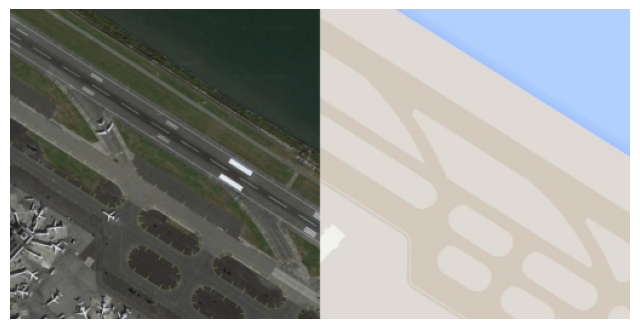

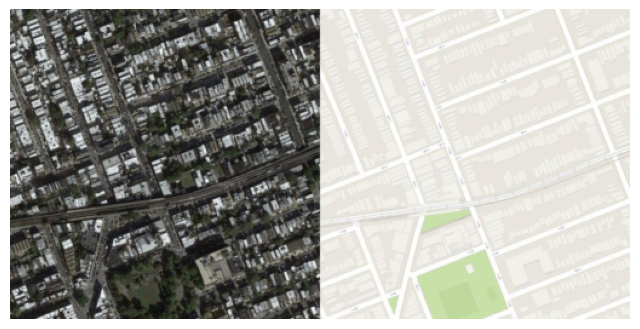

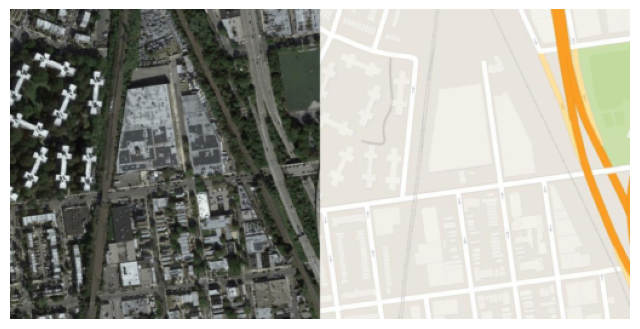

In [ ]:
random_samples = random.choices([data for data in dataloader_train], k=3)
for images, _ in random_samples:
    plot_image(images[0])

## 2. Discriminator and Generator

### Discriminator


In [9]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.layer1 = nn.Sequential(
            nn.Conv2d(in_channels=3*2, out_channels=64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True)
        )

        self.layer2 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels= 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True)
        )

        self.layer3 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True)
        )

        self.layer4 = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=4, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True)
        )

        self.layer5 = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=1, kernel_size=4, stride=1, padding=1, bias=False),
            nn.Sigmoid()
        )


    def forward(self, x):
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.layer5(x)
        return x

In [38]:
discriminator_model = Discriminator()

discriminator_model.to(device)

Discriminator(
  (layer1): Sequential(
    (0): Conv2d(6, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (layer2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (layer3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (layer4): Sequential(
    (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (layer5): Sequential(
    (0): Conv2d

### Generator

In [28]:
class DownSample(nn.Module):
    def __init__(self):
        super(DownSample, self).__init__()

        self.encoder1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=4, stride=2, padding=1, bias=False)

        self.encoder2 = nn.Sequential(
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128)
        )

        self.encoder3 = nn.Sequential(
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
        )

        self.encoder4 = nn.Sequential(
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512)
        )

        self.encoder5 = nn.Sequential(
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512)
        )

        self.encoder6 = nn.Sequential(
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512)
        )

        self.encoder7 = nn.Sequential(
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=4, stride=2, padding=1, bias=False)
        )

    def forward(self, x):
        e1 = self.encoder1(x)
        e2 = self.encoder2(e1)
        e3 = self.encoder3(e2)
        e4 = self.encoder4(e3)
        e5 = self.encoder5(e4)
        e6 = self.encoder6(e5)

        latent_space = self.encoder7(e6)
        list_of_es = (e1, e2, e3, e4, e5, e6)
        return latent_space, list_of_es

In [29]:
class UpSample(nn.Module):
    def __init__(self):
        super(UpSample, self).__init__()

        self.decoder1 = nn.Sequential(
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(in_channels=512, out_channels=512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.Dropout(0.5)
        )

        self.decoder2 = nn.Sequential(
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(in_channels=512*2, out_channels=512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.Dropout(0.5)
        )

        self.decoder3 = nn.Sequential(
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(in_channels=512*2, out_channels=512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.Dropout(0.5)
        )

        self.decoder4 = nn.Sequential(
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(in_channels=512*2, out_channels=256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),

        )

        self.decoder5 = nn.Sequential(
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(in_channels=256*2, out_channels=128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),

        )

        self.decoder6 = nn.Sequential(
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(in_channels=128*2, out_channels=64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),

        )

        self.decoder7 = nn.Sequential(
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(in_channels=64*2, out_channels=3, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
        )


    def forward(self, x, list_of_es):
        e1, e2, e3, e4, e5, e6 = list_of_es
        d1 = torch.cat([self.decoder1(x), e6], dim=1)
        d2 = torch.cat([self.decoder2(d1), e5], dim=1)
        d3 = torch.cat([self.decoder3(d2), e4], dim=1)
        d4 = torch.cat([self.decoder4(d3), e3], dim=1)
        d5 = torch.cat([self.decoder5(d4), e2], dim=1)
        d6 = torch.cat([self.decoder6(d5), e1], dim=1)

        out = self.decoder7(d6)

        return out


In [30]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.upsample = UpSample()
        self.downsample = DownSample()


    def forward(self, x):
        latent, es = self.downsample(x)
        out = self.upsample(latent, list_of_es=es)

        return out

In [32]:
generator_model = Generator()

generator_model = generator_model.to(device)

## 3. training

In [33]:
# discriminator / generator initialization
discriminator_model = Discriminator()
generator_model = Generator()

discriminator_model = discriminator_model.to(device)
generator_model = generator_model.to(device)

In [34]:
lr=0.0002
beta1=0.5
beta2=0.999
L1lambda = 100

the original images


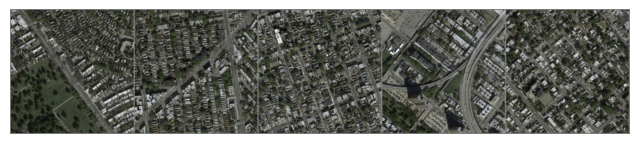

the generated images before training


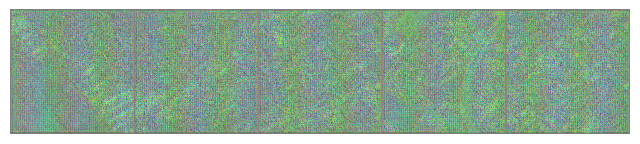

the original maps


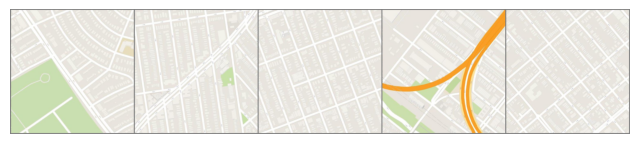

In [35]:
valid_images,_ = next(iter(dataloader_val))

originals = valid_images[:,:,:,:256].to(device)
maps = valid_images[:,:,:,256:].to(device)
generated_images = generator_model(originals)

originals = originals.detach().cpu()
generated_images = generated_images.detach().cpu()
maps = maps.detach().cpu()


print("the original images")
plot_image(torchvision.utils.make_grid(originals, padding=2))
print("the generated images before training")
plot_image(torchvision.utils.make_grid(generated_images, padding=2))
print("the original maps")
plot_image(torchvision.utils.make_grid(maps, padding=2))

In [36]:
criterion = nn.BCELoss()

optimizerD = optim.Adam(discriminator_model.parameters(), lr=lr, betas=(beta1, beta2))
optimizerG = optim.Adam(generator_model.parameters(), lr=lr, betas=(beta1, beta2))

discriminator_model = discriminator_model.to(device)
generator_model = generator_model.to(device)

Epoch 1: Discriminator Loss = 0.004457729170098901, Generator Loss = 2309252.25
the original images


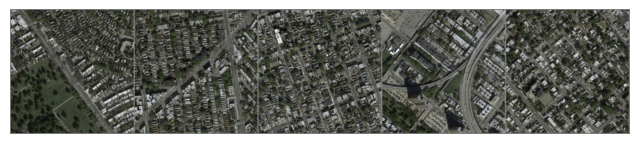

the generated maps


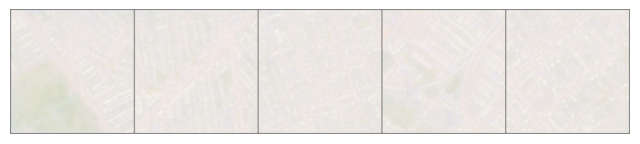

the original maps


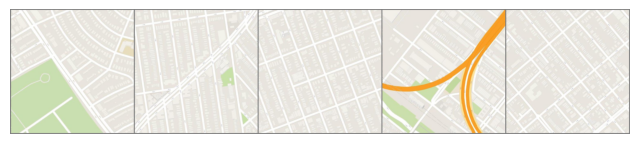

Epoch 2: Discriminator Loss = 0.26003090280573815, Generator Loss = 1136658.125
the original images


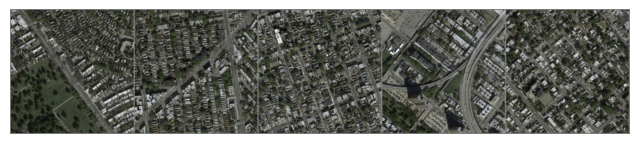

the generated maps


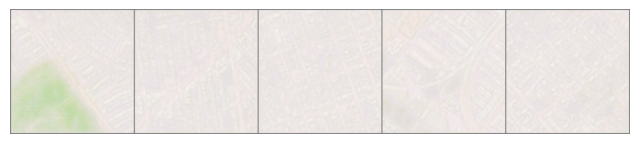

the original maps


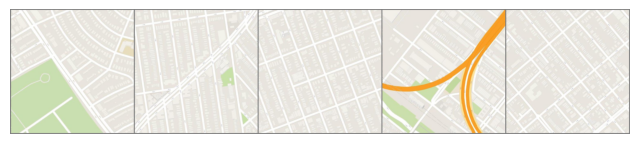

Epoch 3: Discriminator Loss = 0.002018936298554763, Generator Loss = 1016964.9375
the original images


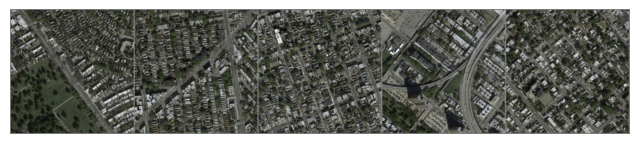

the generated maps


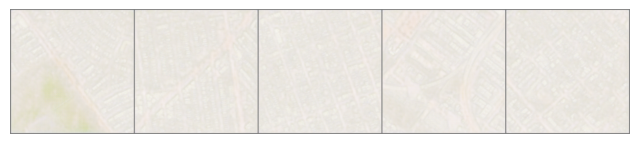

the original maps


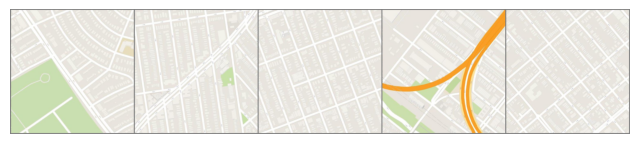

Epoch 4: Discriminator Loss = 0.0160924092924688, Generator Loss = 1166573.0
the original images


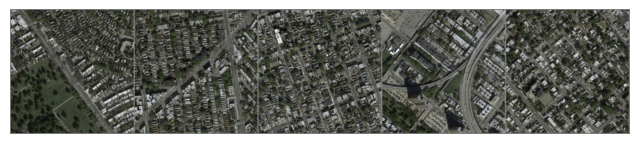

the generated maps


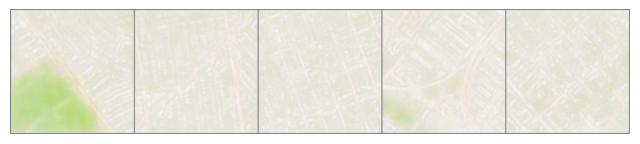

the original maps


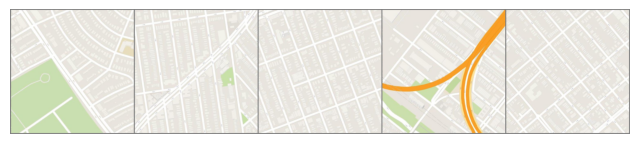

Epoch 5: Discriminator Loss = 0.0006161212877486832, Generator Loss = 949948.9375
the original images


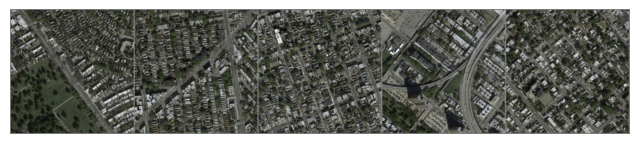

the generated maps


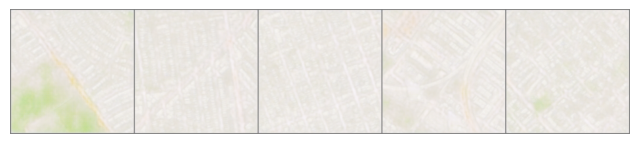

the original maps


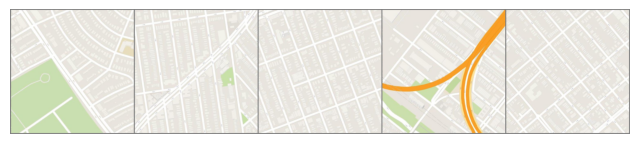

Epoch 6: Discriminator Loss = 0.003209598595276475, Generator Loss = 966908.625
the original images


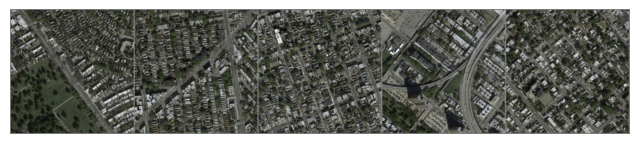

the generated maps


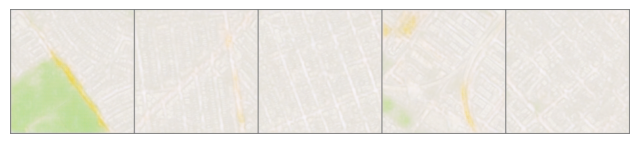

the original maps


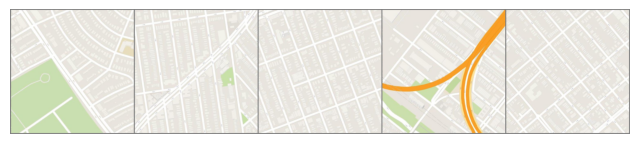

Epoch 7: Discriminator Loss = 0.00019189716113032773, Generator Loss = 1440714.375
the original images


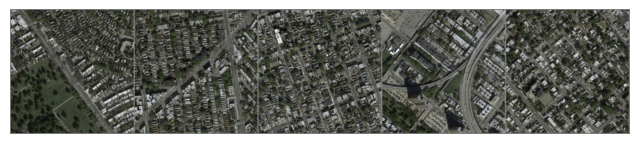

the generated maps


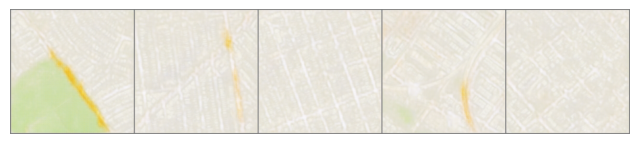

the original maps


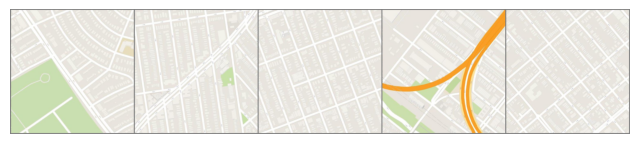

Epoch 8: Discriminator Loss = 0.018118165331543423, Generator Loss = 1476330.0
the original images


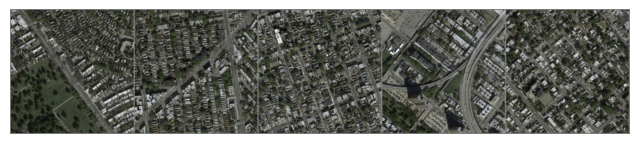

the generated maps


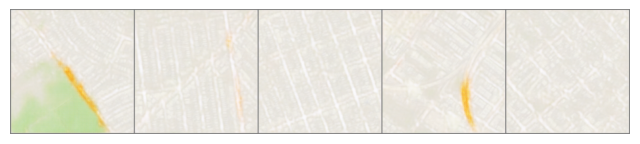

the original maps


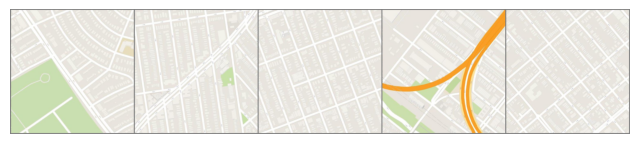

Epoch 9: Discriminator Loss = 0.017969853428894567, Generator Loss = 1999233.125
the original images


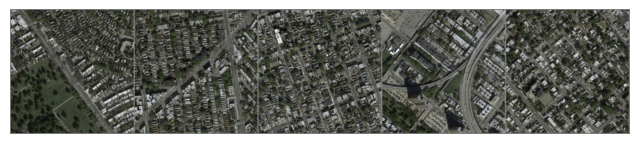

the generated maps


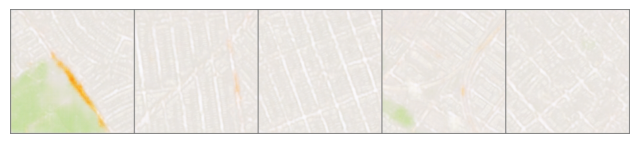

the original maps


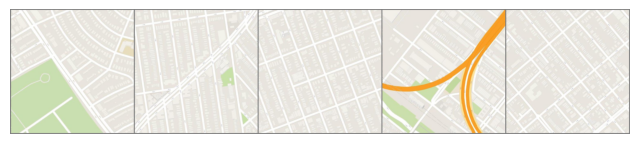

Epoch 10: Discriminator Loss = 0.00655277309124358, Generator Loss = 453569.3125
the original images


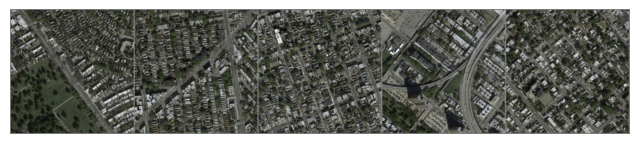

the generated maps


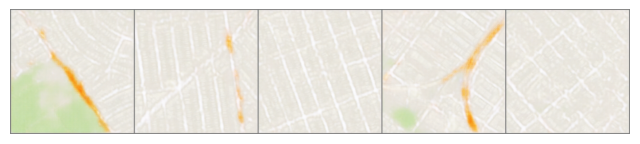

the original maps


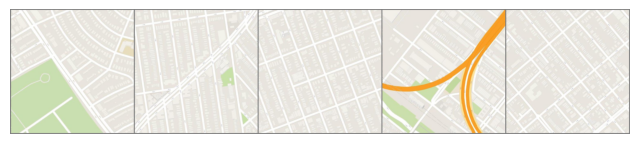

In [37]:
epochs = 10

D_losses = []
G_losses = []

for epoch in range(epochs):
    for images,_ in iter(dataloader_train):
        # saving losses for current epoch
        epoch_D_losses = []
        epoch_G_losses = []

        # training the discriminator model
        discriminator_model.zero_grad()

        # seperating the original from the mapping
        original = images[:,:,:,:256]
        map = images[:,:,:,256:]
        original = original.to(device)
        map = map.to(device)

        # real data
        real = torch.cat([original, map], dim=1)
        real = real.to(device)
        outputs = discriminator_model(real)
        labels = torch.ones(size = outputs.shape, dtype=torch.float, device=device)
        real_lossD = criterion(outputs, labels)/2
        real_lossD.backward()

        # generating fakes
        gen = generator_model(original).detach()

        fake = torch.cat([original, gen], dim=1)
        outputs = discriminator_model(fake)
        labels = torch.zeros(size = outputs.shape, dtype=torch.float, device=device)
        fake_lossD = criterion(outputs, labels)/2
        fake_lossD.backward()

        optimizerD.step()


        # training the generator
        for i in range(2):
            generator_model.zero_grad()

            gens = generator_model(original)
            generated = torch.cat([original, gens], dim=1)
            outputs = discriminator_model(generated)
            labels = torch.ones(size = outputs.shape, dtype=torch.float, device=device)
            # applying loss function
            lossG = criterion(outputs, labels) + L1lambda * torch.abs(gens-map).sum()
            lossG.backward()
            optimizerG.step()
        # adding to epoch losses
        epoch_D_losses.append(real_lossD.item() + fake_lossD.item())
        epoch_G_losses.extend([lossG.item() for _ in range(2)])  # Since G is trained twice
    # collecting epoch losses
    d_loss = sum(epoch_D_losses) / len(epoch_D_losses)
    g_loss = sum(epoch_G_losses) / len(epoch_G_losses)

    D_losses.append(d_loss)
    G_losses.append(g_loss)
    print(f"Epoch {epoch+1}: Discriminator Loss = {d_loss}, Generator Loss = {g_loss}")

    # Valid visualization
    originals = valid_images[:,:,:,:256].to(device)
    maps = valid_images[:,:,:,256:].to(device)
    gen = generator_model(originals)

    originals = originals.detach().cpu()
    gen = gen.detach().cpu()
    maps = maps.detach().cpu()
    print("the original images")
    plot_image(torchvision.utils.make_grid(originals, padding=2))
    print("the generated maps")
    plot_image(torchvision.utils.make_grid(gen, padding=2))
    print("the original maps")
    plot_image(torchvision.utils.make_grid(maps, padding=2))


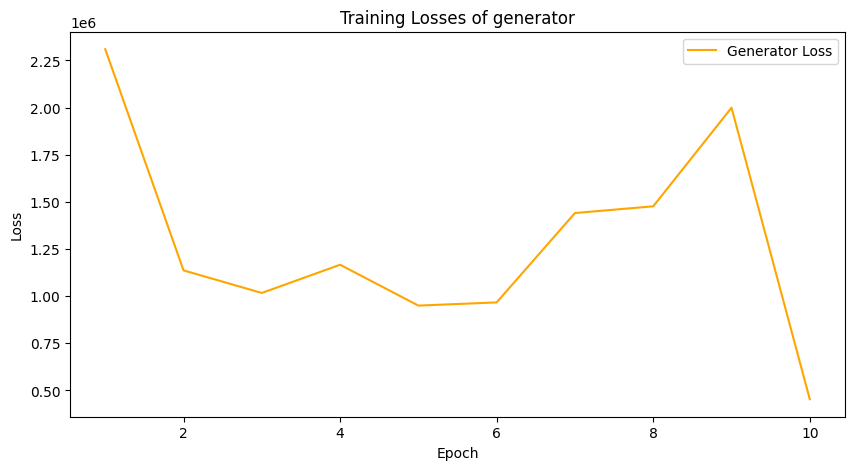

In [44]:
steps = list(range(1, epochs + 1))

plt.figure(figsize=(10, 5))
plt.plot(steps, G_losses, label='Generator Loss', color='orange')
plt.title('Training Losses of generator')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


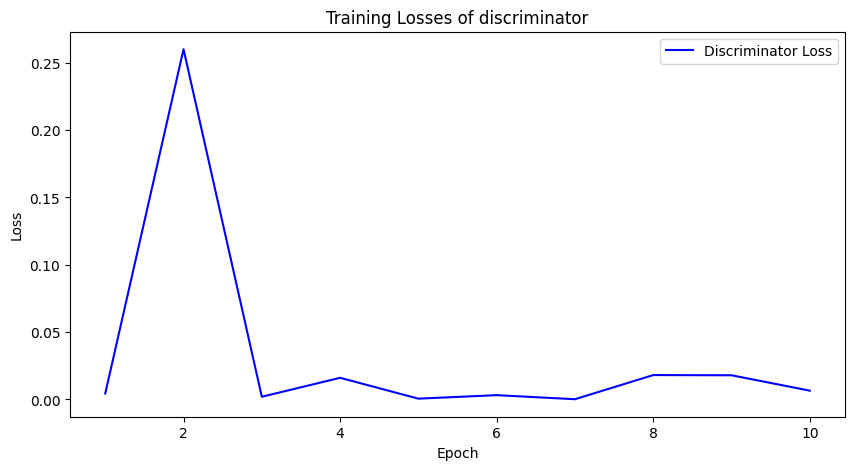

In [45]:
steps = list(range(1, epochs + 1))

plt.figure(figsize=(10, 5))
plt.plot(steps, D_losses, label='Discriminator Loss', color='blue')
plt.title('Training Losses of discriminator')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


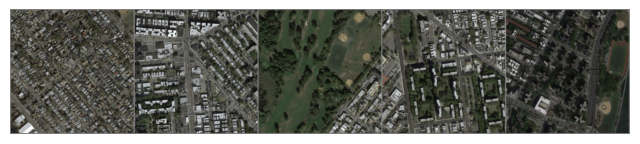

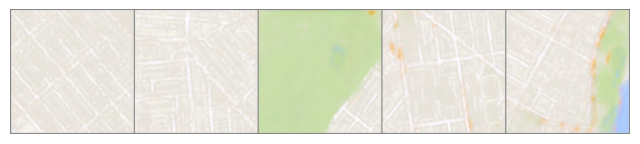

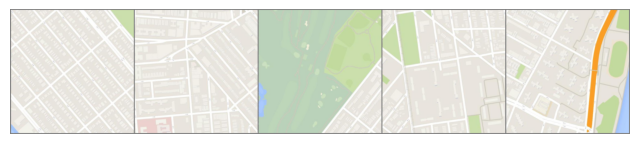

In [47]:
valid_images,_ = next(iter(dataloader_val))

originals = valid_images[:,:,:,:256].to(device)
maps = valid_images[:,:,:,256:].to(device)
generated_images = generator_model(originals)

originals = originals.detach().cpu()
generated_images = generated_images.detach().cpu()
maps = maps.detach().cpu()

plot_image(torchvision.utils.make_grid(originals, padding=2))
plot_image(torchvision.utils.make_grid(generated_images, padding=2))
plot_image(torchvision.utils.make_grid(maps, padding=2))

## 5. alternative dataset

In [59]:
!wget https://efrosgans.eecs.berkeley.edu/pix2pix/datasets/cityscapes.tar.gz
!tar -xzvf cityscapes.tar.gz > /dev/null
!rm -r cityscapes.tar.gz

--2024-07-08 15:36:10--  https://efrosgans.eecs.berkeley.edu/pix2pix/datasets/cityscapes.tar.gz
Resolving efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)... 128.32.244.190
Connecting to efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)|128.32.244.190|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 103441232 (99M) [application/x-gzip]
Saving to: ‘cityscapes.tar.gz’

cityscapes.tar.gz   100%[===================>]  98.65M  20.6MB/s    in 6.0s    

2024-07-08 15:36:17 (16.3 MB/s) - ‘cityscapes.tar.gz’ saved [103441232/103441232]



In [60]:
!mkdir cityscapes/train/data
!mv cityscapes/train/*.jpg cityscapes/train/data
!mkdir cityscapes/val/data
!mv cityscapes/val/*.jpg cityscapes/val/data

In [61]:
train_dir = '/content/cityscapes/train'
val_dir = '/content/cityscapes/val'

transform = transforms.Compose([
    transforms.Resize((256, 512)),
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
])

In [62]:
batch_size = 1

dataset_train = datasets.ImageFolder(root=train_dir, transform=transform)
dataset_val = datasets.ImageFolder(root=val_dir, transform=transform)

dataloader_train = torch.utils.data.DataLoader(dataset_train, batch_size=batch_size, shuffle=True)
dataloader_val = torch.utils.data.DataLoader(dataset_val, batch_size=5, shuffle=True)

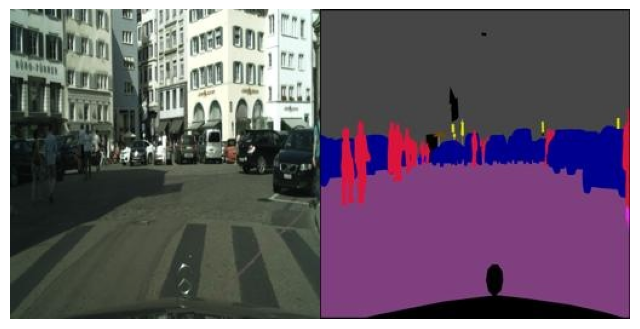

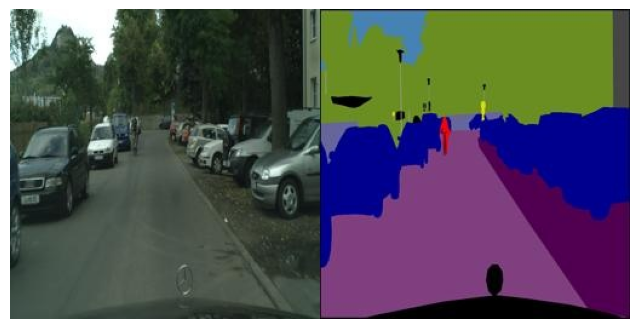

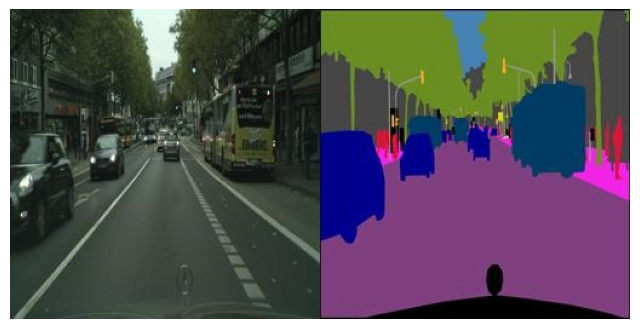

In [63]:
random_samples = random.choices([data for data in dataloader_train], k=3)
for images, _ in random_samples:
    plot_image(images[0])

In [72]:
# discriminator / generator initialization
discriminator_model = Discriminator()
generator_model = Generator()

discriminator_model = discriminator_model.to(device)
generator_model = generator_model.to(device)

the original images


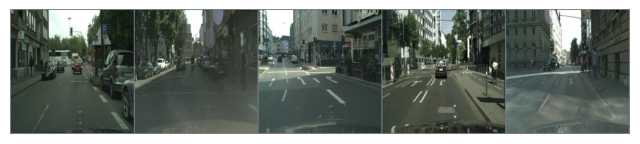

the generated images before training


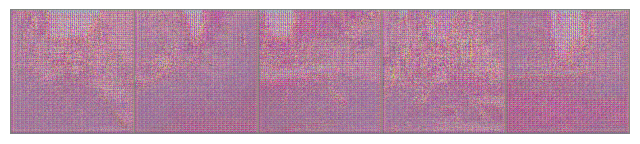

the original maps


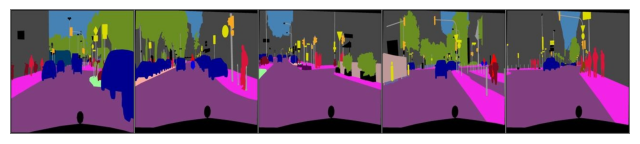

In [69]:
valid_images,_ = next(iter(dataloader_val))

originals = valid_images[:,:,:,:256].to(device)
maps = valid_images[:,:,:,256:].to(device)
generated_images = generator_model(originals)

originals = originals.detach().cpu()
generated_images = generated_images.detach().cpu()
maps = maps.detach().cpu()


print("the original images")
plot_image(torchvision.utils.make_grid(originals, padding=2))
print("the generated images before training")
plot_image(torchvision.utils.make_grid(generated_images, padding=2))
print("the original maps")
plot_image(torchvision.utils.make_grid(maps, padding=2))

In [73]:
criterion = nn.BCELoss()

optimizerD = optim.Adam(discriminator_model.parameters(), lr=lr, betas=(beta1, beta2))
optimizerG = optim.Adam(generator_model.parameters(), lr=lr, betas=(beta1, beta2))

Epoch 1: Discriminator Loss = 0.002695402392419055, Generator Loss = 2293390.5
the original images


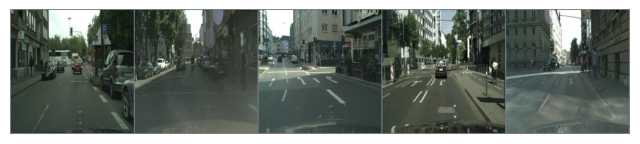

the generated maps


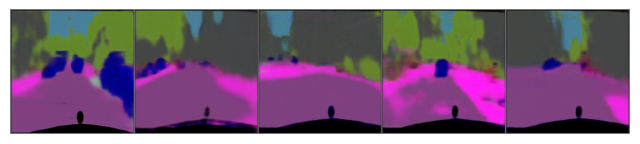

the original maps


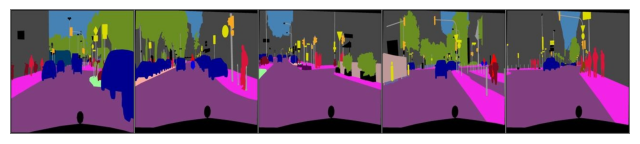

Epoch 2: Discriminator Loss = 0.00014756233940715902, Generator Loss = 1425847.5
the original images


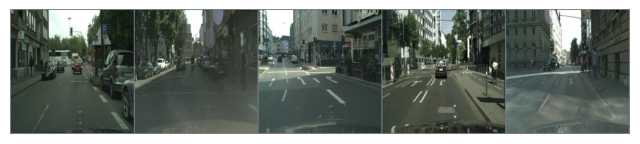

the generated maps


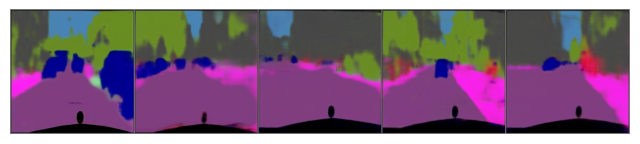

the original maps


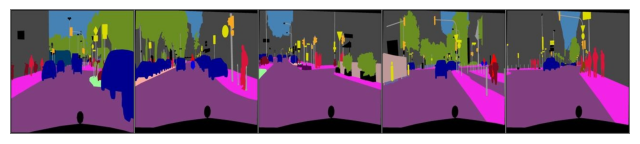

Epoch 3: Discriminator Loss = 0.00022795190307078883, Generator Loss = 1306492.375
the original images


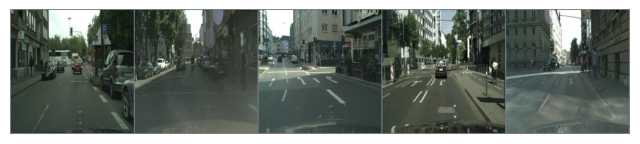

the generated maps


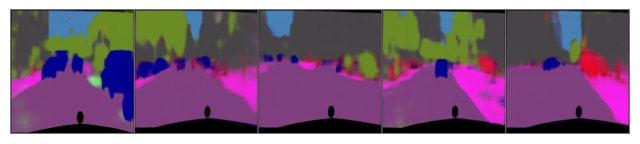

the original maps


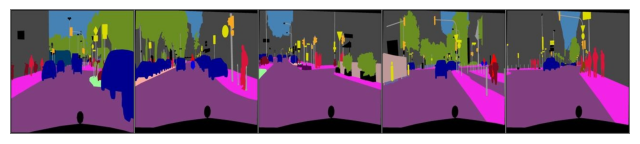

Epoch 4: Discriminator Loss = 0.0002614737813928514, Generator Loss = 1646742.75
the original images


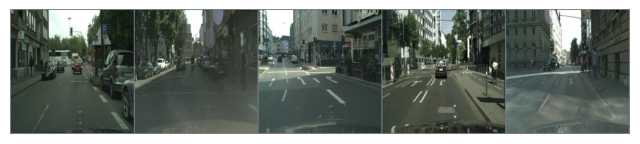

the generated maps


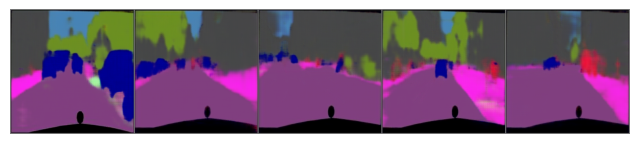

the original maps


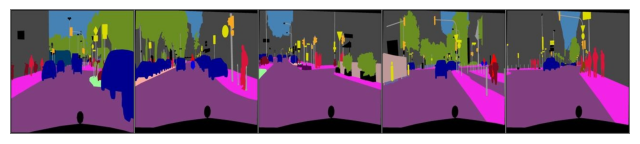

Epoch 5: Discriminator Loss = 0.0003047422605959582, Generator Loss = 1755812.125
the original images


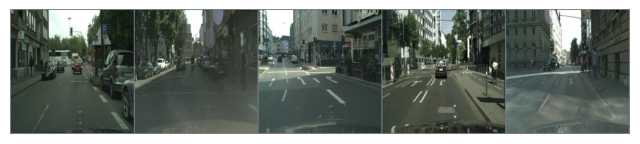

the generated maps


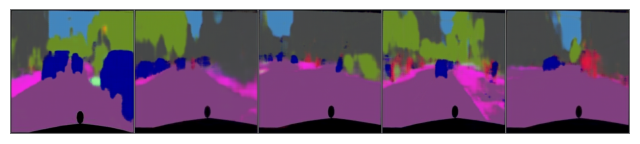

the original maps


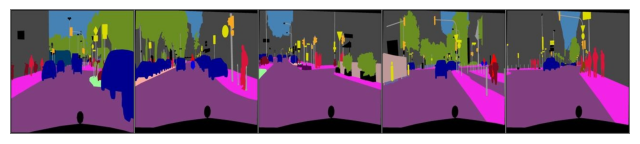

Epoch 6: Discriminator Loss = 0.00035026077239308506, Generator Loss = 3068964.75
the original images


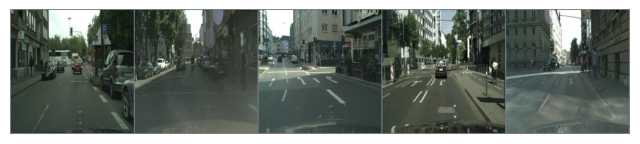

the generated maps


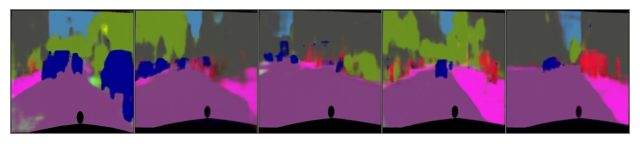

the original maps


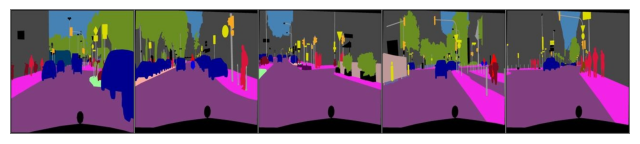

Epoch 7: Discriminator Loss = 0.0029332073172554374, Generator Loss = 773067.3125
the original images


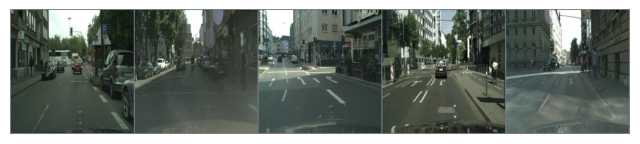

the generated maps


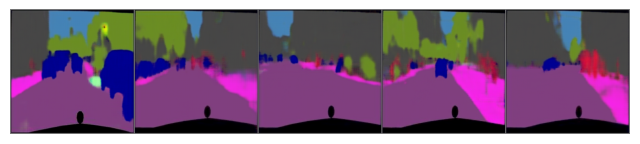

the original maps


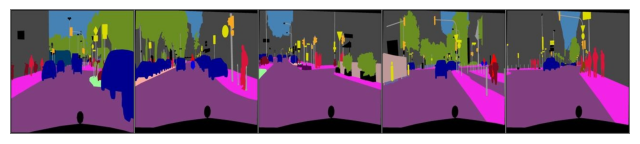

Epoch 8: Discriminator Loss = 9.086390502943686e-05, Generator Loss = 1008297.75
the original images


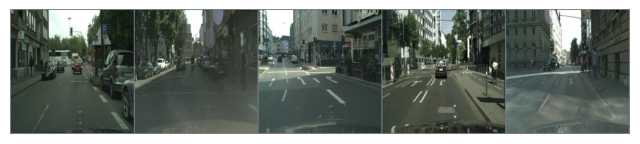

the generated maps


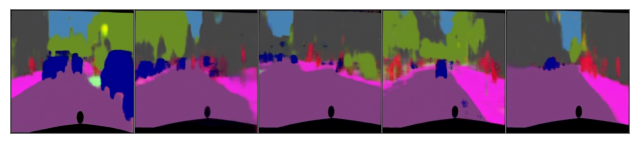

the original maps


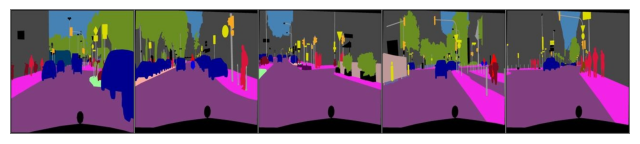

KeyboardInterrupt: 

In [74]:
epochs = 10

D_losses = []
G_losses = []

for epoch in range(epochs):
    for images,_ in iter(dataloader_train):
        # saving losses for current epoch
        epoch_D_losses = []
        epoch_G_losses = []

        # training the discriminator model
        discriminator_model.zero_grad()

        # seperating the original from the mapping
        original = images[:,:,:,:256]
        map = images[:,:,:,256:]
        original = original.to(device)
        map = map.to(device)

        # real data
        real = torch.cat([original, map], dim=1)
        real = real.to(device)
        outputs = discriminator_model(real)
        labels = torch.ones(size = outputs.shape, dtype=torch.float, device=device)
        real_lossD = criterion(outputs, labels)/2
        real_lossD.backward()

        # generating fakes
        gen = generator_model(original).detach()

        fake = torch.cat([original, gen], dim=1)
        outputs = discriminator_model(fake)
        labels = torch.zeros(size = outputs.shape, dtype=torch.float, device=device)
        fake_lossD = criterion(outputs, labels)/2
        fake_lossD.backward()

        optimizerD.step()


        # training the generator
        for i in range(2):
            generator_model.zero_grad()

            gens = generator_model(original)
            generated = torch.cat([original, gens], dim=1)
            outputs = discriminator_model(generated)
            labels = torch.ones(size = outputs.shape, dtype=torch.float, device=device)
            # applying loss function
            lossG = criterion(outputs, labels) + L1lambda * torch.abs(gens-map).sum()
            lossG.backward()
            optimizerG.step()
        # adding to epoch losses
        epoch_D_losses.append(real_lossD.item() + fake_lossD.item())
        epoch_G_losses.extend([lossG.item() for _ in range(2)])  # Since G is trained twice
    # collecting epoch losses
    d_loss = sum(epoch_D_losses) / len(epoch_D_losses)
    g_loss = sum(epoch_G_losses) / len(epoch_G_losses)

    D_losses.append(d_loss)
    G_losses.append(g_loss)
    print(f"Epoch {epoch+1}: Discriminator Loss = {d_loss}, Generator Loss = {g_loss}")

    # Valid visualization
    originals = valid_images[:,:,:,:256].to(device)
    maps = valid_images[:,:,:,256:].to(device)
    gen = generator_model(originals)

    originals = originals.detach().cpu()
    gen = gen.detach().cpu()
    maps = maps.detach().cpu()
    print("the original images")
    plot_image(torchvision.utils.make_grid(originals, padding=2))
    print("the generated maps")
    plot_image(torchvision.utils.make_grid(gen, padding=2))
    print("the original maps")
    plot_image(torchvision.utils.make_grid(maps, padding=2))


In [75]:
epochs = 8

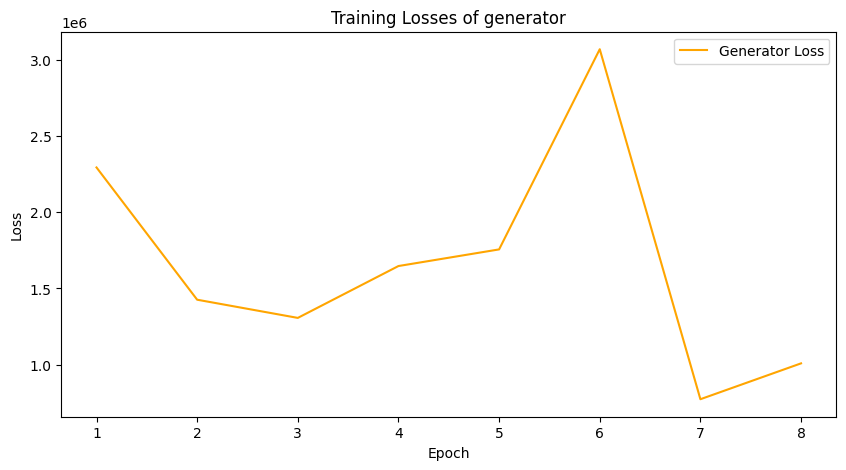

In [76]:
steps = list(range(1, epochs + 1))

plt.figure(figsize=(10, 5))
plt.plot(steps, G_losses, label='Generator Loss', color='orange')
plt.title('Training Losses of generator')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


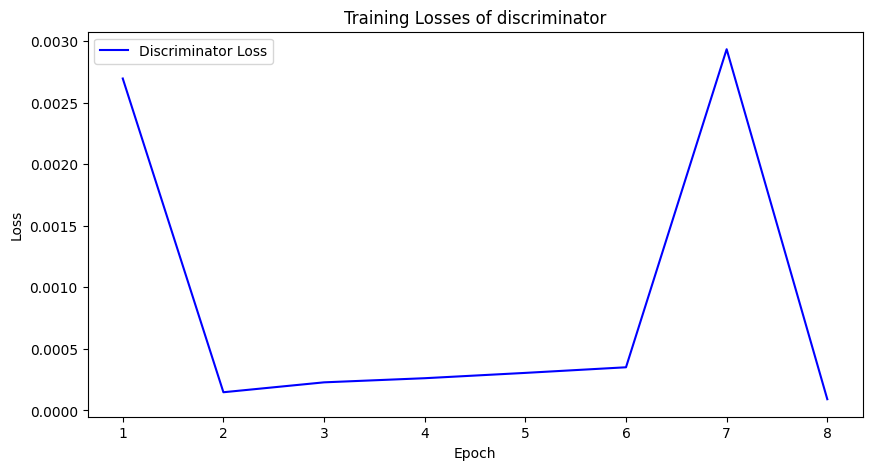

In [77]:
steps = list(range(1, epochs + 1))

plt.figure(figsize=(10, 5))
plt.plot(steps, D_losses, label='Discriminator Loss', color='blue')
plt.title('Training Losses of discriminator')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


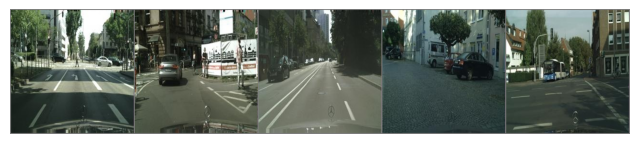

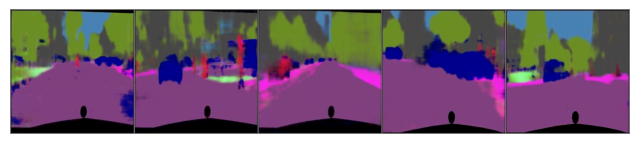

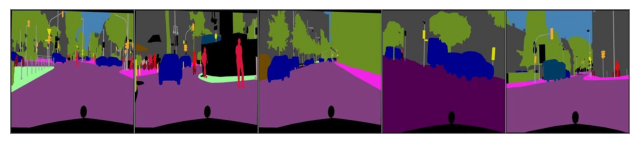

In [79]:
valid_images,_ = next(iter(dataloader_val))

originals = valid_images[:,:,:,:256].to(device)
maps = valid_images[:,:,:,256:].to(device)
generated_images = generator_model(originals)

originals = originals.detach().cpu()
generated_images = generated_images.detach().cpu()
maps = maps.detach().cpu()

plot_image(torchvision.utils.make_grid(originals, padding=2))
plot_image(torchvision.utils.make_grid(generated_images, padding=2))
plot_image(torchvision.utils.make_grid(maps, padding=2))